In [53]:
import matplotlib.pyplot as plt
import numpy as np
import scipy.stats as stats
from scipy.stats import multivariate_normal

#Define the parameters of 3 Gaussian distribution functions in two dimensions

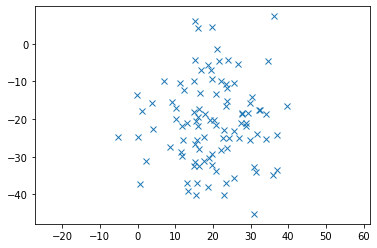

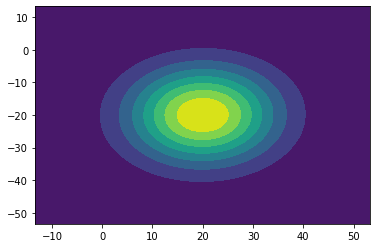

In [70]:
mean = [20, -20]
mu=mean
cov = [[100, 1], 
       [1, 100]] 
sigma=cov
import matplotlib.pyplot as plt
G1=np.random.multivariate_normal(mean, cov, 100)
#print(G1)
#print(G1.T)
labelG1=np.ones(100)*0
x,y=G1.T
plt.plot(x, y, 'x')
plt.axis('equal')
plt.show()



x, y = np.mgrid[mu[0] -1/3*sigma[0][0]:mu[0]+1/3*sigma[0][0]:.1, mu[1] - 1/3*sigma[1][1]: mu[1] + 1/3*sigma[1][1]:.1]
pos = np.dstack((x, y))
rv = multivariate_normal(mean, cov)
fig2 = plt.figure()
ax2 = fig2.add_subplot(111)
ax2.contourf(x, y, rv.pdf(pos))


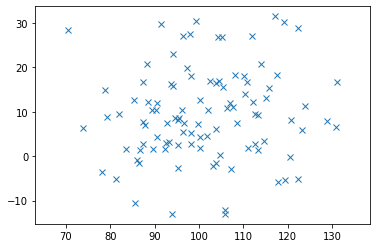

In [71]:
mean = [100, 10]
cov = [[200, 3], 
       [3, 100]] 
mu=mean
sigma=cov
import matplotlib.pyplot as plt
G2=np.random.multivariate_normal(mean, cov, 100)
#print(G1)
#print(G1.T)
labelG2=np.ones(100)*1
x,y=G2.T
plt.plot(x, y, 'x')
plt.axis('equal')
plt.show()

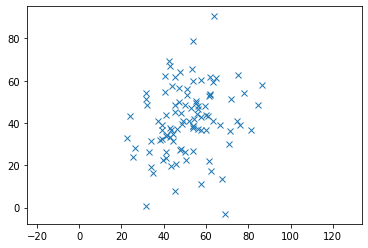

In [72]:
mean = [50, 40]
cov = [[200, 40], 
       [40, 200]] 
import matplotlib.pyplot as plt
G3=np.random.multivariate_normal(mean, cov, 100)
#print(G1)
#print(G1.T)
labelG3=np.ones(100)*2
x,y=G3.T
plt.plot(x, y, 'x')
plt.axis('equal')
plt.show()


In [73]:
data=np.concatenate((np.concatenate((G1,G2),axis=0),G3),axis=0)
labels=np.concatenate((np.concatenate((labelG1,labelG2),axis=0),labelG3),axis=0)

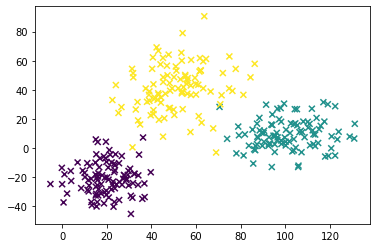

In [74]:
  plt.scatter(
        data[:,0], 
        data[:,1],  
        c=labels,
            marker='x')

#EM algorithm to solve the Mixture of Gaussians 

In [75]:
import numpy as np
from scipy.stats import multivariate_normal

class GMM:
    def __init__(self, k, max_iter=5):
        self.k = k
        self.max_iter = int(max_iter)

    def initialize(self, X):
        self.shape = X.shape
        self.n, self.m = self.shape

        self.phi = np.full(shape=self.k, fill_value=1/self.k)
        #print(self.phi)
        self.weights = np.full( shape=(self.n,self.k), fill_value=1/self.k)
        #print(self.weights)
        random_row = np.random.randint(low=0, high=self.n, size=self.k)
        #print(random_row)
        self.mu = [  X[row_index,:] for row_index in random_row ]
        #print("mu",self.mu[0])
        self.sigma = [ np.cov(X.T) for _ in range(self.k) ]
        #print("sigma",self.sigma[0])

    def e_step(self, X):
        # E-Step: update weights and phi holding mu and sigma constant
        self.weights = self.predict_proba(X)
        self.phi = self.weights.mean(axis=0)
        #print("phi",self.phi)
   
    def m_step(self, X):
        # M-Step: update mu and sigma holding phi and weights constant
        for i in range(self.k):
            #obtinene los pesos de la funcionk
            weight = self.weights[:, [i]]
            total_weight = weight.sum()
            self.mu[i] = (X * weight).sum(axis=0) / total_weight
    
            mean=X.sum(axis=0)/self.n
            #print(np.dot((X-mean).T,(X-mean))/self.n)
            sigma=0
            for p in range(self.n):
              ys = np.reshape(X[p]-self.mu[i], (2,1))
              sigma +=weight[p]*np.dot(ys,ys.T)
            sigma /=total_weight

            self.sigma[i]=sigma
            #print("sigma",self.sigma[i])

    def fit(self, X):
        self.initialize(X)
        
        for iteration in range(self.max_iter):
          self.e_step(X)
          self.m_step(X)
            
    def predict_proba(self, X):
        likelihood = np.zeros((self.n, self.k))
        for i in range(self.k):
            distribution = multivariate_normal(
                mean=self.mu[i], 
                cov=self.sigma[i])
            likelihood[:,i] = distribution.pdf(X)
          
        numerator = likelihood * self.phi
        #print(numerator[0])
        denominator = numerator.sum(axis=1)[:, np.newaxis]
        #print(denominator[0])
        weights = numerator / denominator
        #print("weights: ",weights[0])
        return weights
    
    def predict(self, X):
        weights = self.predict_proba(X)
        return np.argmax(weights, axis=1)

In [76]:
np.random.seed(42)
gmm = GMM(k=3, max_iter=40)
gmm.fit(data)
predict=gmm.predict(data)
print(predict)

[0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 2 2 2 2 2 2 2 2 2 2 2
 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 1 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2
 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2
 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 2 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 2 1 1 1 1 1 1 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1]


In [83]:
print(gmm.sigma)
print(gmm.mu)

[array([[ 83.88449524,   2.62630164],
       [  2.62630164, 117.19907236]]), array([[178.87349552,  54.47982899],
       [ 54.47982899, 235.40496753]]), array([[179.33648879,  19.35525177],
       [ 19.35525177, 101.16417633]])]
[array([ 19.83347161, -20.97608553]), array([51.04992293, 41.64851779]), array([100.86030203,   9.19818453])]


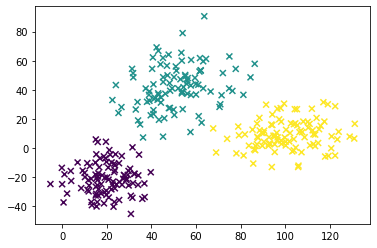

In [78]:
  plt.scatter(
        data[:,0], 
        data[:,1], 
            c=predict, 
            marker='x')

In [81]:
np.random.seed(1)
prediction_data=[]
for i in range(len(gmm.mu)):
  sample_data=np.random.multivariate_normal(gmm.mu[i],gmm.sigma[i], 100000)
  if i==0:
    prediction_data=sample_data
  else:
    prediction_data=(np.concatenate((prediction_data,sample_data),axis=0))


In [82]:
import plotly.graph_objects as go
import numpy as np

fig = go.Figure(go.Histogram2dContour(
        x =  prediction_data[:,0],
        y =  prediction_data[:,1],
        colorscale = 'Blues'
))

fig.show()

#K-means algorithm

In [84]:
from sklearn.cluster import KMeans
import numpy as np

kmeans = KMeans(n_clusters=3).fit(data)
kmeans.labels_

predict=kmeans.predict(data)
print(predict)
kmeans.cluster_centers_


[1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 2 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2
 2 2 2 2 2 0 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2
 2 2 2 2 2 2 2 1 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2
 2 2 2 2]


array([[101.16397301,   9.10936031],
       [ 19.98148699, -20.65642081],
       [ 51.43441023,  41.91603322]])

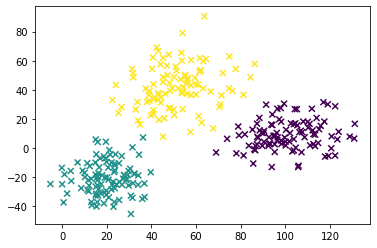

In [85]:
plt.scatter(
        data[:,0], 
        data[:,1], 
            c=predict, 
            marker='x')
